In [215]:
# used to supress display of warnings
import warnings

# os is used to provide a way of using operating system dependent functionality
# We use it for setting working folder
import os

# Pandas is used for data manipulation and analysis
import pandas as pd 

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays 
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot

# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns


## Scikit-learn features various classification, regression and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import average_precision_score,precision_score,recall_score,f1_score, fbeta_scoreconfusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from scipy.stats import zscore
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler

# DOMAIN :- Telecom

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Import and warehouse data

## Task: Import all the given datasets and explore shape and size of each.

In [3]:
T_da1 = pd.read_csv('TelcomCustomer-Churn_1.csv')
T_da1.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No


In [4]:
T_da1.shape

(7043, 10)

In [5]:
T_da2 = pd.read_csv('TelcomCustomer-Churn_2.csv')
T_da2.head()

,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
T_da2.shape

(7043, 11)

## Task: Merge all datasets onto one and explore final shape and size

In [18]:
#concat the two dataframe.. 
T_data=pd.concat([T_da1,T_da2],axis=1,sort=False)
T_data
#axis = 1 is column wise seperation
#axis = 0 is row wise sepeartion

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


In [19]:
T_data.drop('customerID',axis=1, inplace=True) # ID is identification,so it is droped

In [20]:
T_data.shape

(7043, 20)

In [21]:

T_data.dtypes.to_frame(name=" Data Type")

,Data Type
gender,object
SeniorCitizen,int64
Partner,object
Dependents,object
tenure,int64
PhoneService,object
MultipleLines,object
InternetService,object
OnlineSecurity,object
OnlineBackup,object


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data cleansing


## Task: Explore and if required correct the datatypes of each attribute
## Explore for null values in the attributes and if required drop or impute values

In [22]:
T_data.isnull().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [23]:
T_data['SeniorCitizen'] = T_data['SeniorCitizen'].astype("object") # Convert Senior Citizen to object , since it has 1,0 format

In [24]:
T_data.isna().any()

gender              False
SeniorCitizen       False
Partner             False
Dependents          False
tenure              False
PhoneService        False
MultipleLines       False
InternetService     False
OnlineSecurity      False
OnlineBackup        False
DeviceProtection    False
TechSupport         False
StreamingTV         False
StreamingMovies     False
Contract            False
PaperlessBilling    False
PaymentMethod       False
MonthlyCharges      False
TotalCharges        False
Churn               False
dtype: bool

In [58]:
T_data = T_data.dropna()

In [59]:
na_cols = T_data.isna().any()
na_cols = na_cols[na_cols == True].reset_index()
na_cols = na_cols["index"].tolist()
for col in T_data.columns[1:]:
     if col in na_cols:
        if T_data[col].dtype != 'object':
             T_data[col] =  T_data[col].fillna(T_data[col].mean()).round(0)

In [60]:
T_data.isna().any() # Re-validating

gender              False
SeniorCitizen       False
Partner             False
Dependents          False
tenure              False
PhoneService        False
MultipleLines       False
InternetService     False
OnlineSecurity      False
OnlineBackup        False
DeviceProtection    False
TechSupport         False
StreamingTV         False
StreamingMovies     False
Contract            False
PaperlessBilling    False
PaymentMethod       False
MonthlyCharges      False
TotalCharges        False
Churn               False
dtype: bool

## Converting Float to Categorical 

In [28]:
T_data['TotalCharges'] = pd.to_numeric(T_data['TotalCharges'],errors='coerce')
T_data['TotalCharges'] = T_data['TotalCharges'].astype("float")

In [29]:
T_data.dtypes.to_frame(name=" Data Type") ## Converted Total charges to float

,Data Type
gender,object
SeniorCitizen,object
Partner,object
Dependents,object
tenure,int64
PhoneService,object
MultipleLines,object
InternetService,object
OnlineSecurity,object
OnlineBackup,object


In [30]:
print(T_data.gender.value_counts())
print("")
print(T_data.SeniorCitizen.value_counts())
print("")
print(T_data.Partner.value_counts())
print("")
print(T_data.Dependents.value_counts())
print("")
print(T_data.PhoneService.value_counts())
print("")
print(T_data.MultipleLines.value_counts())
print("")
print(T_data.InternetService.value_counts())
print("")
print(T_data.OnlineSecurity.value_counts())
print("")
print(T_data.OnlineBackup.value_counts())
print("")
print(T_data.DeviceProtection.value_counts())
print("")
print(T_data.TechSupport.value_counts())
print("")
print(T_data.StreamingTV.value_counts())
print("")
print(T_data.StreamingMovies.value_counts())
print("")
print(T_data.Contract.value_counts())
print("")
print(T_data.PaperlessBilling.value_counts())
print("")
print(T_data.PaymentMethod.value_counts())
print("")
print(T_data.Churn.value_counts())

Male      3555
Female    3488
Name: gender, dtype: int64

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

No     3641
Yes    3402
Name: Partner, dtype: int64

No     4933
Yes    2110
Name: Dependents, dtype: int64

Yes    6361
No      682
Name: PhoneService, dtype: int64

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64

No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype: int64

No                     3473
Yes                    2044
No internet service    1526
Name: TechSupport, dtype: int64

No                     2810
Yes     

In [31]:
#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique values
le_count = 0
for col in T_data.columns[0:]:
    if T_data[col].dtype == 'object':
        if len(list(T_data[col].unique())) <= 2:
            le.fit(T_data[col])
            T_data[col] = le.transform(T_data[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

7 columns were label encoded.


In [32]:
T_data.head() # sample of lable encoding

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,0,0,0,0,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,151.65,1


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data analysis & visualisation:

## Detailed statistical analysis on the data

In [33]:
T_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   int32  
 1   SeniorCitizen     7043 non-null   int32  
 2   Partner           7043 non-null   int32  
 3   Dependents        7043 non-null   int32  
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   int32  
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   int32  
 16  PaymentMethod     7043 non-null   object 


In [34]:
T_data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
gender,7043.0,NaN,NaN,NaN,0.504756,0.500013,0.0,0.0,1.0,1.0,1.0
SeniorCitizen,7043.0,NaN,NaN,NaN,0.162147,0.368612,0.0,0.0,0.0,0.0,1.0
Partner,7043.0,NaN,NaN,NaN,0.483033,0.499748,0.0,0.0,0.0,1.0,1.0
Dependents,7043.0,NaN,NaN,NaN,0.299588,0.45811,0.0,0.0,0.0,1.0,1.0
tenure,7043.0,NaN,NaN,NaN,32.371149,24.559481,0.0,9.0,29.0,55.0,72.0
PhoneService,7043.0,NaN,NaN,NaN,0.903166,0.295752,0.0,1.0,1.0,1.0,1.0
MultipleLines,7043,3,No,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043,3,No,3498,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineBackup,7043,3,No,3088,NaN,NaN,NaN,NaN,NaN,NaN,NaN


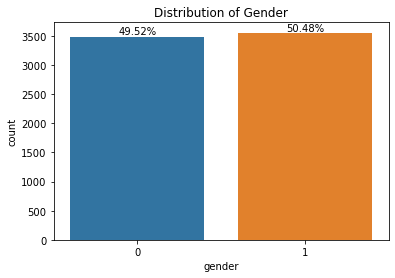

In [35]:
fig, ax = plt.subplots()
width = len(T_data['gender'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'gender') 
plt.title('Distribution of Gender')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    


## Dataset has proper distribution on each gender,but Male has higher value count 

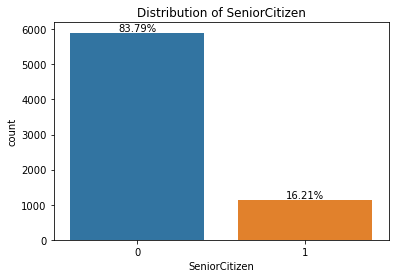

In [36]:
fig, ax = plt.subplots()
width = len(T_data['SeniorCitizen'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'SeniorCitizen') 
plt.title('Distribution of SeniorCitizen')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

## Dataset shows majortiy of the people are  young

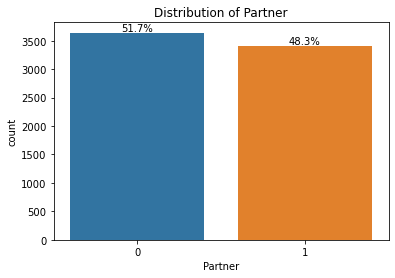

In [37]:
fig, ax = plt.subplots()
width = len(T_data['Partner'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'Partner') 
plt.title('Distribution of Partner')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

## Dataset has equal distribution on Partner, but without partner has higher value counts

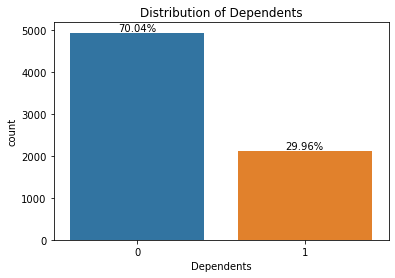

In [38]:
fig, ax = plt.subplots()
width = len(T_data['Dependents'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'Dependents') 
plt.title('Distribution of Dependents')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

## 70% data has no-dependents

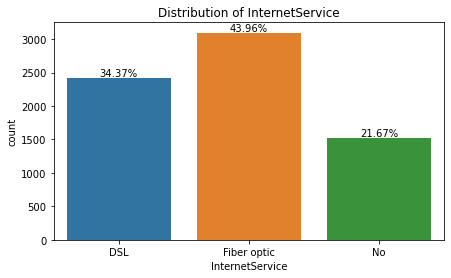

In [39]:

fig, ax = plt.subplots()
width = len(T_data['InternetService'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'InternetService') 
plt.title('Distribution of InternetService')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

## Majority of them use Fiber optic as a Internet service

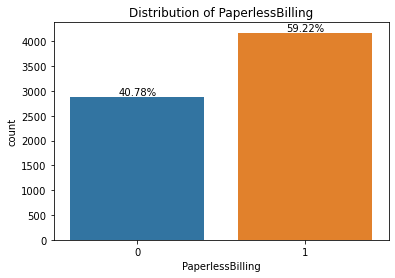

In [40]:

fig, ax = plt.subplots()
width = len(T_data['PaperlessBilling'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'PaperlessBilling') 
plt.title('Distribution of PaperlessBilling')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

## Most of them prefer paperless billing

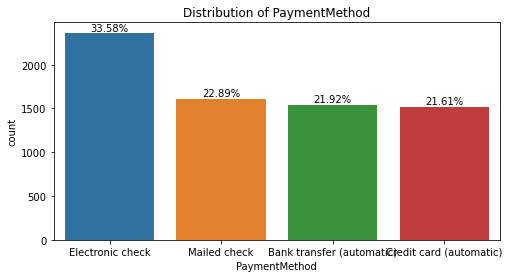

In [41]:

fig, ax = plt.subplots()
width = len(T_data['PaymentMethod'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'PaymentMethod') 
plt.title('Distribution of PaymentMethod')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64


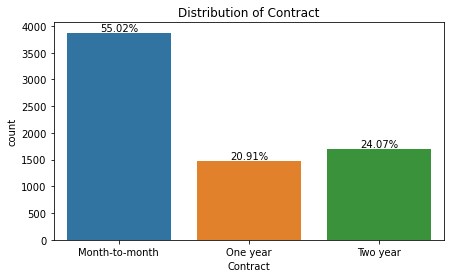

In [42]:

fig, ax = plt.subplots()
width = len(T_data['Contract'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'Contract') 
plt.title('Distribution of Contract')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
print(T_data.Contract.value_counts())  

In [30]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [43]:
import plotly.express as px
fig = px.histogram(T_data, x="tenure")  
fig.show()


In [44]:
import plotly.express as px
fig = px.histogram(T_data, x="MonthlyCharges")  
fig.show()


In [45]:
import plotly.express as px
fig = px.histogram(T_data, x="TotalCharges")  
fig.show()


# Observation on above
### 1.Gender distribution shows that the dataset features a relatively equal proportion of male and female customers. Almost half of the customers in our dataset are female whilst the other half are male.
### 2.Most of the customers in the dataset are younger people.
### 3.Not many customers seem to have dependents whilst almost half of the customers have a partner.
### 4.Most of the customers seem to have phone service and 3/4th of them have opted for paperless Billing

# Distribution of label encoded categorical variables:

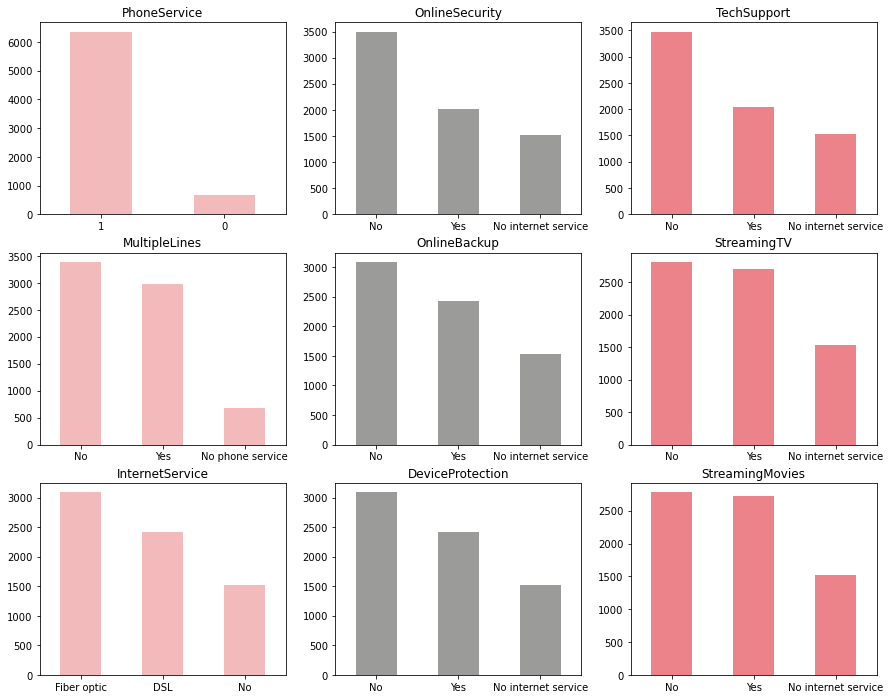

In [46]:
services= ['PhoneService','MultipleLines','InternetService','OnlineSecurity',  'OnlineBackup','DeviceProtection',
           'TechSupport','StreamingTV','StreamingMovies']
fig, axes = plt.subplots(nrows = 3,ncols = 3,figsize = (15,12))
for i, item in enumerate(services):
    if i < 3:
        ax = T_data[item].value_counts().plot(
    kind = 'bar',ax=axes[i,0],
    rot = 0, color ='#f3babc' )
        
    elif i >=3 and i < 6:
        ax = T_data[item].value_counts().plot(
    kind = 'bar',ax=axes[i-3,1],
    rot = 0,color ='#9b9c9a')
        
    elif i < 9:
        ax = T_data[item].value_counts().plot(
    kind = 'bar',ax=axes[i-6,2],rot = 0,
    color = '#ec838a')
    ax.set_title(item)

1.Most of the customers have phone service out of which almost half of the customers have multiple lines.

2.3/4th of the customers have opted for internet service via Fiber Optic and DSL connections with almost half of the internet sers subscribing to streaming TV and movies.

3.Customers who have availed Online Backup, Device Protection, Technical Support and Online Security features are a minority.

0    5174
1    1869
Name: Churn, dtype: int64


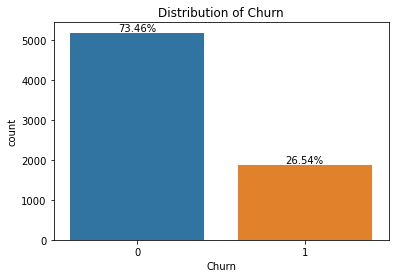

In [47]:

fig, ax = plt.subplots()
width = len(T_data['Churn'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'Churn') 
plt.title('Distribution of Churn')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
print(T_data.Churn.value_counts())  

## A preliminary look at the overall churn rate shows that around 74% of the customers are active. As shown in the chart above, this is an imbalanced classification problem.

# Bivariant analysis

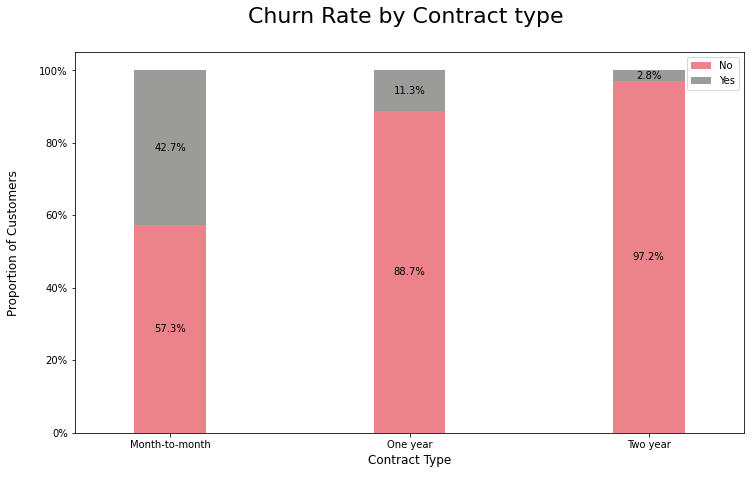

In [48]:
import matplotlib.ticker as mtick
contract_churn =T_data.groupby(['Contract','Churn']).size().unstack()
contract_churn.rename(columns={0:'No', 1:'Yes'}, inplace=True)
colors  = ['#ec838a','#9b9c9a']
ax = (contract_churn.T*100.0 / contract_churn.T.sum()).T.plot(kind='bar',width = 0.3,stacked = True,rot = 0,figsize = (12,7),color = colors)
plt.ylabel('Proportion of Customers\n',
horizontalalignment="center",fontstyle = "normal", 
fontsize = "large", fontfamily = "sans-serif")
plt.xlabel('Contract Type\n',horizontalalignment="center",
fontstyle = "normal", fontsize = "large", 
fontfamily = "sans-serif")
plt.title('Churn Rate by Contract type \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif")
plt.legend(loc='upper right', fontsize = "medium")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.1f}%'.format(height), 
            horizontalalignment='center', 
            verticalalignment='center')
ax.autoscale(enable=False, axis='both', tight=False)

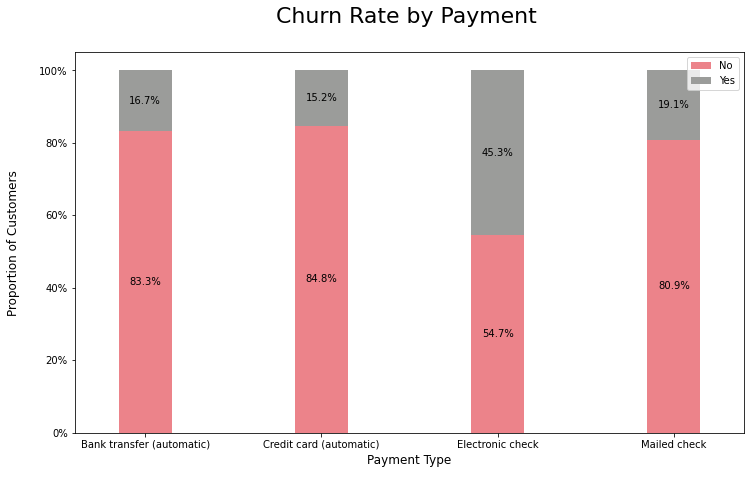

In [49]:
import matplotlib.ticker as mtick
Payment_churn =T_data.groupby(['PaymentMethod','Churn']).size().unstack()
Payment_churn.rename(columns={0:'No', 1:'Yes'}, inplace=True)
colors  = ['#ec838a','#9b9c9a']
ax = (Payment_churn.T*100.0 / Payment_churn.T.sum()).T.plot(kind='bar',width = 0.3,stacked = True,rot = 0,figsize = (12,7),color = colors)
plt.ylabel('Proportion of Customers\n',
horizontalalignment="center",fontstyle = "normal", 
fontsize = "large", fontfamily = "sans-serif")
plt.xlabel('Payment Type\n',horizontalalignment="center",
fontstyle = "normal", fontsize = "large", 
fontfamily = "sans-serif")
plt.title('Churn Rate by Payment \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif")
plt.legend(loc='upper right', fontsize = "medium")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.1f}%'.format(height), 
            horizontalalignment='center', 
            verticalalignment='center')
ax.autoscale(enable=False, axis='both', tight=False)

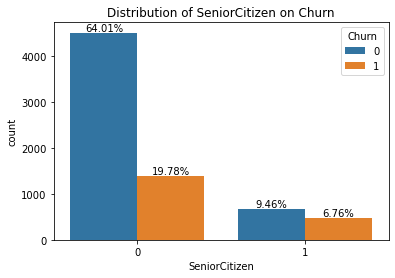

In [50]:
fig, ax = plt.subplots()
width = len(T_data['SeniorCitizen'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'SeniorCitizen',hue="Churn") 
plt.title('Distribution of SeniorCitizen on Churn')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    


Comment: Churn(yes)rate for Without partner is high


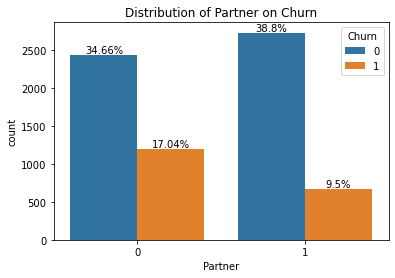

In [51]:
fig, ax = plt.subplots()
width = len(T_data['Partner'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'Partner',hue="Churn") 
plt.title('Distribution of Partner on Churn')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    
print("Comment: Churn(yes)rate for Without partner is high" )

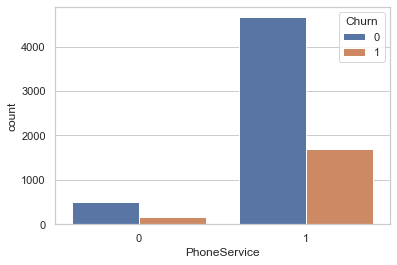

In [52]:
sns.set(style="whitegrid", color_codes=True)
sns.countplot(x="PhoneService", hue= "Churn", data=T_data);

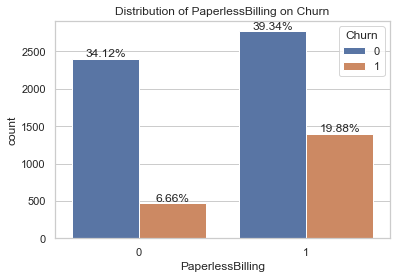

In [53]:
fig, ax = plt.subplots()
width = len(T_data['PaperlessBilling'].unique()) + 4
fig.set_size_inches(width,4)
ax=sns.countplot(data = T_data, x= 'PaperlessBilling',hue="Churn") 
plt.title('Distribution of PaperlessBilling on Churn')


for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(T_data)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')   
    


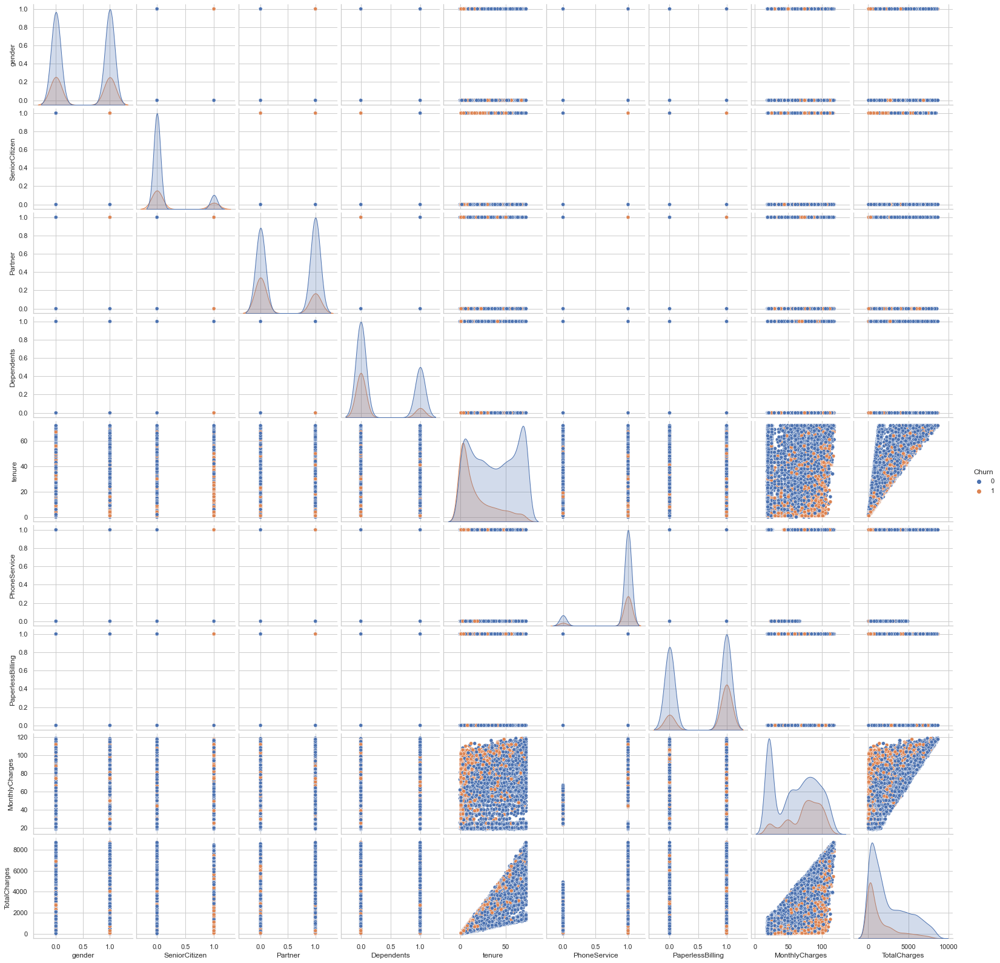

In [54]:
sns.pairplot(T_data,hue='Churn');

In [55]:
x = T_data[['SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'PaperlessBilling',
        'MonthlyCharges', 'TotalCharges']]
correlations = x.corrwith(T_data.Churn)
correlations = correlations[correlations!=1]
positive_correlations = correlations[correlations >0].sort_values(ascending = False)
negative_correlations =correlations[correlations<0].sort_values(ascending = False)
print('Most Positive Correlations: \n', positive_correlations)
print('\nMost Negative Correlations: \n', negative_correlations)



Most Positive Correlations: 
 MonthlyCharges      0.193356
PaperlessBilling    0.191825
SeniorCitizen       0.150889
PhoneService        0.011942
dtype: float64

Most Negative Correlations: 
 Partner        -0.150448
Dependents     -0.164221
TotalCharges   -0.199484
tenure         -0.352229
dtype: float64


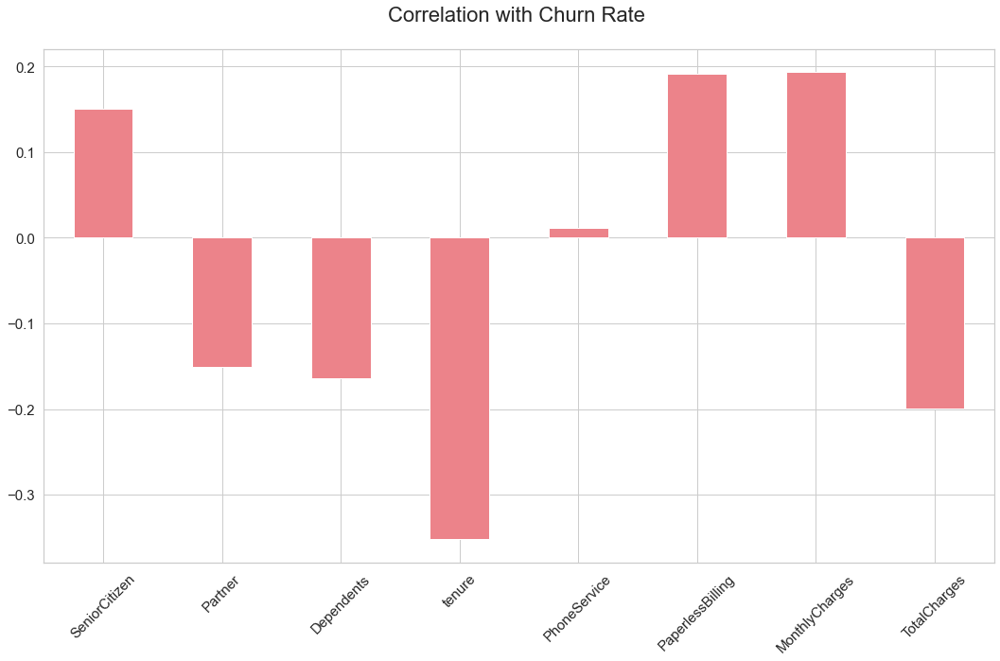

In [56]:
correlations = x.corrwith(T_data.Churn)
correlations = correlations[correlations!=1]
correlations.plot.bar(figsize = (18, 10),fontsize = 15, 
        color = '#ec838a',
        rot = 45, grid = True)
plt.title('Correlation with Churn Rate \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif");

In [61]:
import pandas_profiling
pandas_profiling.ProfileReport(T_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Data Pre-Processing
   

In [62]:
T_data = pd.get_dummies(T_data) # converting all caterogrical variables to dummies

In [63]:
#Identify target and features variable:
    
y = T_data["Churn"]
X = T_data.drop(columns="Churn")

In [64]:
#Train - test split 

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state = 42)

In [65]:
#Data shape of train and test data

print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (4922, 40)
Number transactions y_train dataset:  (4922,)
Number transactions X_test dataset:  (2110, 40)
Number transactions y_test dataset:  (2110,)


In [66]:
# % of data split in train and test data 

print("{0:0.2f}% data is in training set".format((len(X_train)/len(T_data.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(T_data.index)) * 100))

69.99% data is in training set
30.01% data is in test set


In [67]:
T_data.describe() #main dataset

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
count,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,...,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,0.504693,0.162400,0.482509,0.298493,32.421786,0.903299,0.592719,64.798208,2283.300441,0.265785,...,0.395478,0.216155,0.388367,0.551052,0.209329,0.239619,0.219283,0.216297,0.336320,0.228100
std,0.500014,0.368844,0.499729,0.457629,24.545260,0.295571,0.491363,30.085974,2266.771362,0.441782,...,0.488988,0.411650,0.487414,0.497422,0.406858,0.426881,0.413790,0.411748,0.472483,0.419637
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,0.000000,35.587500,401.450000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,29.000000,1.000000,1.000000,70.350000,1397.475000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,1.000000,55.000000,1.000000,1.000000,89.862500,3794.737500,1.000000,...,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,72.000000,1.000000,1.000000,118.750000,8684.800000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [68]:
X_train.describe() #Train dataset

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
count,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,...,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000,4922.000000
mean,0.510768,0.160301,0.480902,0.297034,32.459163,0.901463,0.593052,64.601656,2275.301412,0.485575,...,0.390898,0.219423,0.389679,0.546323,0.209265,0.244413,0.211296,0.221252,0.339902,0.227550
std,0.499935,0.366922,0.499686,0.456998,24.636303,0.298070,0.491315,30.119859,2261.949057,0.499843,...,0.488001,0.413898,0.487727,0.497900,0.406825,0.429782,0.408270,0.415132,0.473724,0.419293
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,18.250000,18.850000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,0.000000,35.150000,400.075000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,29.000000,1.000000,1.000000,70.300000,1387.725000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,1.000000,56.000000,1.000000,1.000000,89.800000,3765.912500,1.000000,...,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,72.000000,1.000000,1.000000,118.600000,8684.800000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## on comparing the original dataset with train dataset, we see similarity between those two datasets.


# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e8;">  Model training, testing and tuning:
   

# Using entropy

In [69]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option 
# could be gini index.  Restricting the depth of the tree to 5 (no particular reason for selecting this)

model_entropy=DecisionTreeClassifier(criterion='entropy')

In [70]:
model_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [71]:
model_entropy.score(X_train, y_train)  # performance on train data

0.9985778138967899

In [72]:
model_entropy.score(X_test, y_test)  # performance on test data

0.7222748815165877

# Training data has 99% accuracy - seems to be over fitting. 

In [81]:
from sklearn.tree import export_graphviz

train_char_label = ['No', 'Yes']
Churn_Tree_File = open('churn_tree.dot','w')
dot_data = export_graphviz(model_entropy, out_file=Churn_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))
Churn_Tree_File.close()

In [82]:
from os import system
from IPython.display import Image

#Works only if "dot" command works on you machine

retCode = system("dot -Tpng churn_tree.dot -o churn_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("churn_tree.png"))

## Tree looks Overfitting
### Doing Reduction in tree

In [118]:
dTreeR = DecisionTreeClassifier(criterion = 'entropy', max_depth = 5, random_state=1)
dTreeR.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1)

In [119]:
print(dTreeR.score(X_train, y_train))
print(dTreeR.score(X_test, y_test))

0.8065826899634295
0.7815165876777251


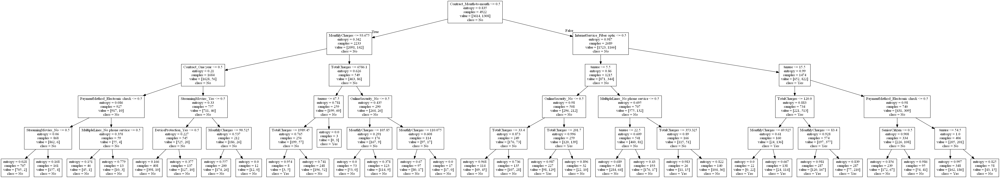

In [120]:
# printing the reduced dtree
train_char_label = ['No', 'Yes']
Churn_Tree_FileR = open('churn_treeR.dot','w')
dot_data = export_graphviz(dTreeR, out_file=Churn_Tree_FileR, feature_names = list(X_train), class_names = list(train_char_label))
Churn_Tree_FileR.close()

#Works only if "dot" command works on you machine

retCode = system("dot -Tpng churn_treeR.dot -o churn_treeR.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("churn_treeR.png"))


In [121]:
# importance of features in the tree building 
Imp = pd.DataFrame(dTreeR.feature_importances_, columns = ["Imp"], index = X_train.columns)

In [122]:
Imp

,Imp
gender,0.000000
SeniorCitizen,0.003899
Partner,0.000000
Dependents,0.000000
tenure,0.130206
PhoneService,0.000000
PaperlessBilling,0.000000
MonthlyCharges,0.071715
TotalCharges,0.044847
MultipleLines_No,0.000000


In [123]:
Imp.loc[Imp.Imp > 0] #Importance independent varible

,Imp
SeniorCitizen,0.003899
tenure,0.130206
MonthlyCharges,0.071715
TotalCharges,0.044847
MultipleLines_No phone service,0.013872
InternetService_Fiber optic,0.117394
OnlineSecurity_No,0.022121
DeviceProtection_Yes,0.003341
StreamingMovies_No,0.003787
StreamingMovies_Yes,0.009889


From the dataset, we can see Tenure,Monthly charges, Total charges, Internet services,Contract are having high important features that give value to churn data.

0.7815165876777251


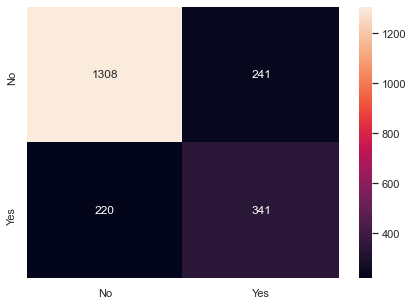

In [124]:
print(dTreeR.score(X_test , y_test))
y_predict = dTreeR.predict(X_test)

cm = confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g');

In [125]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1549
           1       0.59      0.61      0.60       561

    accuracy                           0.78      2110
   macro avg       0.72      0.73      0.72      2110
weighted avg       0.78      0.78      0.78      2110



In [132]:
acc_DT_E = dTreeR.score(X_test, y_test)
acc_DT_E

0.7815165876777251

## The model accuracy comes around 78%

## Using Gini

In [126]:
model_gini=DecisionTreeClassifier(criterion='gini', max_depth = 5, random_state=1)

In [127]:
model_gini.fit(X_train, y_train)
print(model_gini.score(X_train, y_train))  # performance on train data
print(model_gini.score(X_test, y_test)) # performace on test data

0.8043478260869565
0.781042654028436


In [128]:
from sklearn.tree import export_graphviz

train_char_label1= ['No', 'Yes']
Churn_Treeg_File = open('churn_treeg.dot','w')
dot_data1 = export_graphviz(model_gini, out_file=Churn_Treeg_File, feature_names = list(X_train), class_names = list(train_char_label))
Churn_Treeg_File.close()

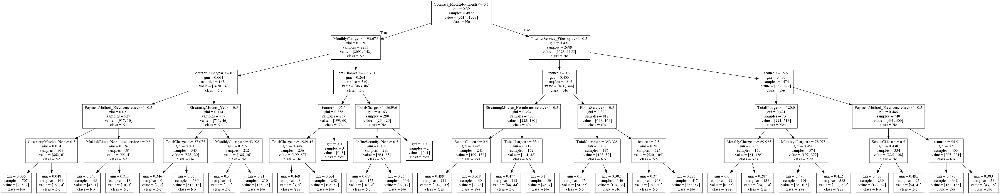

In [129]:
from os import system
from IPython.display import Image

#Works only if "dot" command works on you machine

retCode1 = system("dot -Tpng churn_treeg.dot -o churn_treeg.png")
if(retCode1>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("churn_treeg.png"))

In [191]:
acc_DT_G = dTreeRg.score(X_test, y_test)
acc_DT_G

0.7843601895734598

In [192]:
#Store the accuracy results for each model in a dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Decision Tree_Entropy'], 'accuracy': acc_DT_E})
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree_Entropy,0.781517


In [193]:
tempResultsDf = pd.DataFrame({'Method':['Decision Tree_Gini'], 'accuracy': [acc_DT_G]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree_Entropy,0.781517
0,Decision Tree_Gini,0.784360


#### Compared to the Entroy and Gini in DT - DT using Gini has higher value

## Using Random forest

In [194]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(X_train, y_train)

In [195]:
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

In [196]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf


,Method,accuracy
0,Decision Tree_Entropy,0.781517
0,Decision Tree_Gini,0.784360
0,Random Forest,0.777725


## Apply Adaboost Ensemble Algorithm for the same data and print the accuracy.


In [197]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier( n_estimators= 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(X_train, y_train)

In [198]:
pred_AB =abcl.predict(X_test)
acc_AB = accuracy_score(y_test, pred_AB)

In [199]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree_Entropy,0.781517
0,Decision Tree_Gini,0.784360
0,Random Forest,0.777725
0,Adaboost,0.795261


#### Adaboosting Ensemble perform better than DT and RF model

### Apply Bagging Classifier Algorithm and print the accuracy.

In [200]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22)
bgcl = bgcl.fit(X_train, y_train)

In [201]:
pred_BG =bgcl.predict(X_test)
acc_BG = accuracy_score(y_test, pred_BG)

In [202]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree_Entropy,0.781517
0,Decision Tree_Gini,0.784360
0,Random Forest,0.777725
0,Adaboost,0.795261
0,Bagging,0.775829


### Apply GradientBoost Classifier Algorithm for the same data and print the accuracy

In [203]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(X_train, y_train)

In [204]:
pred_GB =gbcl.predict(X_test)
acc_GB = accuracy_score(y_test, pred_GB)

In [205]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree_Entropy,0.781517
0,Decision Tree_Gini,0.784360
0,Random Forest,0.777725
0,Adaboost,0.795261
0,Bagging,0.775829
0,Gradient Boost,0.797630


In [206]:
resultsDf=resultsDf.sort_values(by='accuracy')

In [207]:
resultsDf.set_index('Method')

,accuracy
Method,
Bagging,0.775829
Random Forest,0.777725
Decision Tree_Entropy,0.781517
Decision Tree_Gini,0.784360
Adaboost,0.795261
Gradient Boost,0.797630


#### Comparing all the above, Gradient Boosting has higher accuracy on test data
#### For this dataset, Boosting  models give the best results on test predictions. So, this model can be selected to make prediction

From the above, we can definitely conclude that Gradient Boost is an optimal model of choice for the given dataset as it has relatively the highest accuracy scores; giving most number of correct positive predictions while minimizing the false negatives

# Insights

1. We made use of a customer churn dataset to build a machine learning classifier that predicts the propensity of any customer to churn in months to come with a reasonable accuracy score of 76% to 80%

Suggestion: Dataset need to include - Occupation, Secondary Network Provide to compare the plans.